# Text Analytics Assignment

### Note: Few cells in the code takes a while to run. Please be patient.

In [1]:
# importing all libraries

import os
import pandas as pd
import numpy as np
import glob as gb
import string
import nltk
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
%matplotlib notebook
from scipy.cluster.hierarchy import ward, dendrogram

from sklearn import decomposition
from sklearn.decomposition import TruncatedSVD

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ADITI\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ADITI\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [2]:
# getting folder from the path. 
#The ipynb file has to be on the same location as the folder containing the excel data.

os.chdir("Patents_xls")
files=gb.glob('*.xlsx')
files

['Apple.xlsx',
 'Google.xlsx',
 'HTC.xlsx',
 'Huawei.xlsx',
 'InterDigital.xlsx',
 'Kodak.xlsx',
 'LG.xlsx',
 'Nokia.xlsx',
 'Oracle.xlsx',
 'Pantech.xlsx',
 'Samsung.xlsx',
 'Sony Ericsson.xlsx',
 'ZTE.xlsx']

### Preprocessing the text

In [3]:
def parse(txt, punct = True, numbers = True, lemmatize = True):
    
    txt = txt.lower()
    #remove punctuation if necessary
    import string
    if punct:
        p = string.punctuation
        tbl = str.maketrans(p, len(p) * " ")
        txt = txt.translate(tbl)
    if numbers:
        d = string.digits
        tbl = str.maketrans(d, len(d) * " ")
        txt = txt.translate(tbl)
    
    #remove stopwords
    import nltk
    stopwords = nltk.corpus.stopwords.words('english')
    tokens = nltk.word_tokenize(txt)
    word_list = [word for word in txt.split() if word not in stopwords and len(word) > 2]
    
    
    #lemmatize by default
    if lemmatize:
        lemmatizer = WordNetLemmatizer()
        word_list = [lemmatizer.lemmatize(w) for w in word_list]
    
    txt = " ".join(word_list)

    return txt

In [4]:
patent=[]
companies=[]
for f in files:
    df = pd.read_excel(f)   # getting data from excel and converting into dataframe
    df.dropna(inplace=True)  # drop all rows with null values
    
    df['TIAB']=df.AB.str.cat(df.TI,sep=" ")  # Concat 'Title'(TI) and 'abstract'(AB) rows and save it in seperate dataframe.
    combine_li = df['TIAB'].tolist()    # converting dataframe to list
    
    combined_txt = " ".join(combine_li) 
    parsed_txt = parse(combined_txt)  # call to parse function to preprocess the text
    
    patent.append(parsed_txt) # append string received after preprocessing to a list
    
    name = f.split(".")[0] # get company names
    companies.append(name)


In [5]:
companies  # printing company names

['Apple',
 'Google',
 'HTC',
 'Huawei',
 'InterDigital',
 'Kodak',
 'LG',
 'Nokia',
 'Oracle',
 'Pantech',
 'Samsung',
 'Sony Ericsson',
 'ZTE']

In [6]:
patent # printing preprocessed list of data

['system method managing data metadata one exemplary method metadata file created several different software application captured captured metadata searched type information metadata one type file differs type information metadata another type file method described data processing system machine readable medium also described method system managing data system method integrating medium object viewing manipulation via computing device personal computer system method may provided via application program interface api provides function allow application program create scene add medium object scene method includes preparing translation vector rotation matrix medium object define orientation location medium object scene scene including medium object displayed interface provided user may manipulate scene object therein system method may implemented personal computer computing device system method integrating medium object electronic device accessory headset electronic device provided microph

### TF-IDF VECTORIZER

In [7]:
# Applying TFIDF vectorizer
# min_df = 2 means "ignore terms that appear in less than 2 documents".

vectorizer = TfidfVectorizer(min_df=2)
sparse_matrix = vectorizer.fit_transform(patent)

In [8]:
sparse_matrix.shape

(13, 9227)

In [9]:
print(sparse_matrix.toarray())

[[0.00037653 0.         0.         ... 0.00881653 0.00041369 0.00127157]
 [0.         0.         0.         ... 0.00210264 0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.00011924 0.         0.00010933 ... 0.0006515  0.         0.00016779]
 [0.         0.         0.         ... 0.01436308 0.00101092 0.00077682]
 [0.00656633 0.         0.         ... 0.         0.         0.        ]]


In [10]:
# get feature names from vectorizer
features=vectorizer.get_feature_names()
print(features)

['aaa', 'aal', 'ab', 'abbreviated', 'abbreviation', 'aberration', 'ability', 'ablation', 'able', 'abnormal', 'abnormality', 'abnormally', 'abort', 'aborted', 'abr', 'abrasion', 'abrasive', 'abrupt', 'abruptly', 'absence', 'absent', 'absolute', 'absorb', 'absorbed', 'absorbent', 'absorber', 'absorbing', 'absorbs', 'absorption', 'abstract', 'abstracted', 'abstracting', 'abstraction', 'abut', 'abuts', 'abutting', 'ac', 'accelerate', 'accelerated', 'accelerates', 'accelerating', 'acceleration', 'accelerator', 'accelerometer', 'accept', 'acceptability', 'acceptable', 'acceptance', 'accepted', 'accepting', 'acceptor', 'accepts', 'access', 'accessed', 'accessibility', 'accessible', 'accessing', 'accessory', 'accidental', 'accommodate', 'accommodated', 'accommodates', 'accommodating', 'accommodation', 'accompanied', 'accompanies', 'accompanying', 'accomplish', 'accomplished', 'accomplishes', 'accomplishing', 'accord', 'accordance', 'according', 'accordingly', 'account', 'accounting', 'accumula

In [11]:
#cosine similarity
similarity = cosine_similarity(sparse_matrix)
#convert to distance
cos_distance = 1 - similarity 
cos_distance

array([[ 0.00000000e+00,  9.69640150e-02,  3.89755631e-01,
         3.28323711e-01,  3.62475723e-01,  3.92369321e-01,
         3.57345156e-01,  1.59683905e-01,  1.84046658e-01,
         4.68268778e-01,  3.22556562e-01,  2.11150833e-01,
         4.31818964e-01],
       [ 9.69640150e-02,  1.11022302e-16,  4.09700843e-01,
         2.63573104e-01,  3.09670563e-01,  4.39241080e-01,
         3.85937819e-01,  1.08585281e-01,  1.68537991e-01,
         3.96932180e-01,  3.63064361e-01,  2.15032318e-01,
         3.82476647e-01],
       [ 3.89755631e-01,  4.09700843e-01, -2.22044605e-16,
         5.70970016e-01,  5.81073399e-01,  5.65038437e-01,
         4.97564721e-01,  3.95764966e-01,  5.11367215e-01,
         5.91879658e-01,  4.42989799e-01,  3.42786558e-01,
         6.76004526e-01],
       [ 3.28323711e-01,  2.63573104e-01,  5.70970016e-01,
        -2.22044605e-16,  4.09384949e-01,  6.25250034e-01,
         4.61261593e-01,  1.85874996e-01,  3.37571696e-01,
         4.43352696e-01,  4.76054135e

## UNSUPERVISED LEARNING ALGORITHMS

### MULTI DIMENTIONAL SCALING

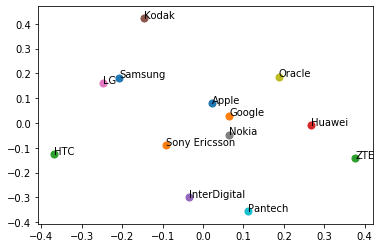

In [12]:
# applying MDS to visualize high-dimensional distance data in two—dimensions.
vectorizer = TfidfVectorizer(min_df=2)
sparse_matrix = vectorizer.fit_transform(patent)

#cosine similarity
similarity = cosine_similarity(sparse_matrix)
#convert to distance
cos_distance = 1 - similarity 

mds = MDS(n_components = 2, dissimilarity='precomputed', random_state=1)
pos = mds.fit_transform(cos_distance)

xs, ys = pos[:,0], pos[:,1]                  
                                            
for x, y, c in zip(xs, ys, companies):      
    plt.scatter(x, y, s= 50)
    plt.text(x, y, c)

plt.show()

### HIERARCHICAL CLUSTERING

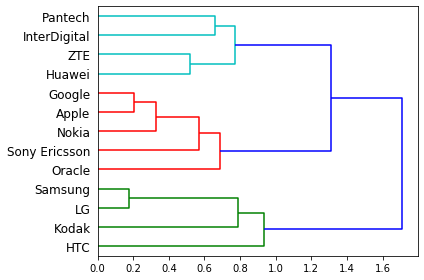

In [13]:
# Applying hierarchical clustering to combine the most similar clusters together
# printing dendrogram to understand the clusters among the companies
vectorizer = TfidfVectorizer(min_df=2)
sparse_matrix = vectorizer.fit_transform(patent)

#cosine similarity
similarity = cosine_similarity(sparse_matrix)
#convert to distance
cos_distance = 1 - similarity 
cos_distance

linkage_matrix = ward(cos_distance)
dendrogram(linkage_matrix, orientation='right', labels=companies)
plt.tight_layout()
plt.show()

### K-MEANS

In [14]:
# applying k means algorithm with 4 clusters
vectorizer = TfidfVectorizer(min_df=2)
sparse_matrix = vectorizer.fit_transform(patent)

#cosine similarity
similarity = cosine_similarity(sparse_matrix)
#convert to distance
cos_distance = 1 - similarity 
cos_distance

km = KMeans(n_clusters=4, random_state=1)  
km.fit(sparse_matrix)  
clusterPred = km.predict(sparse_matrix)
docDistance = km.transform(sparse_matrix)

In [15]:
clusters = zip(clusterPred, companies)
for a, b in clusters:    
    print(a,":", b)
    cluster_docs = {'docs': companies, 'cluster': clusterPred,           
                'dis_to_0':docDistance[0:,0],          
                'dis_to_1':docDistance[0:,1],           
                'dis_to_2':docDistance[0:,2],      
                'dis_to_3':docDistance[0:,3],}
    clusterDf = pd.DataFrame(cluster_docs)      # getting distance of individual document

0 : Apple
0 : Google
0 : HTC
2 : Huawei
0 : InterDigital
1 : Kodak
1 : LG
0 : Nokia
0 : Oracle
3 : Pantech
1 : Samsung
0 : Sony Ericsson
2 : ZTE


In [16]:
print(clusterDf)

             docs  cluster  dis_to_0  dis_to_1  dis_to_2      dis_to_3
0           Apple        0  0.369994  0.732433  0.791228  9.677487e-01
1          Google        0  0.331036  0.783436  0.715506  8.909907e-01
2             HTC        0  0.698060  0.908482  1.054928  1.088007e+00
3          Huawei        2  0.675970  0.929151  0.366198  9.416504e-01
4    InterDigital        0  0.649490  0.970723  0.828535  9.251245e-01
5           Kodak        1  0.878842  0.540406  1.097967  1.174569e+00
6              LG        1  0.772916  0.376367  0.959965  9.943756e-01
7           Nokia        0  0.361892  0.793889  0.613938  8.056804e-01
8          Oracle        0  0.553639  0.915472  0.833157  1.071136e+00
9         Pantech        3  0.786217  0.982563  0.880539  2.580957e-08
10        Samsung        1  0.734520  0.318556  0.969882  1.031050e+00
11  Sony Ericsson        0  0.506753  0.818493  0.891574  7.812629e-01
12            ZTE        2  0.809384  1.045590  0.366198  9.655024e-01


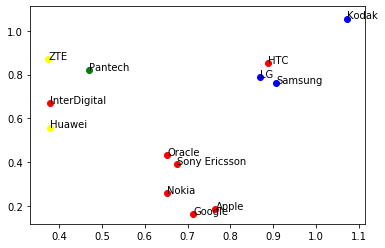

In [17]:
colors = {0:'red', 1:'blue', 2:'yellow', 3:'green'}

pos = km.fit_transform(cos_distance)
xs, ys = pos[:,0], pos[:,1]                  
                                            
for x, y, c, cluster in zip(xs, ys, companies, clusterPred):      
    plt.scatter(x, y, c=colors[cluster])
    plt.text(x, y, c)

plt.show()

### Analysis from unsupervised learning algorithms:

We see that in all three clustering algorithms:
1. Companies: Apple, Google, Nokia and Sony Ericson are most similar. Therefore, it can be interpreted that the patents granted to these companies are similar to each other.

2. Companies: Samsung and LG shows similarity as well. But at the same time they are in seperate clusters to the companies in 1st point.

3. There is some dissimilarity in the results as well. For example, HTC is always found in seperate group in all three algorithms. 

4. In MDS and K means, we see that Kodak is situated very far from all the companies. It can be possible because this company deals with different line of products that is photography. Due to which there patent will be of different type.

## TOPIC MODELING

### NMF

In [18]:
vectorizer = TfidfVectorizer(min_df=2, stop_words='english')
sparse_matrix = vectorizer.fit_transform(patent)

topicCount = 5  # taking topic count as 5
topWordsCount = 10
clf = decomposition.NMF(n_components = topicCount, random_state=1)
clf.fit_transform(sparse_matrix)
wordsList = []

for c in clf.components_:   
    wordIndex = np.argsort(c)[::-1][0:topWordsCount]   
    wordsList.append([features[w] for w in wordIndex])
    
for l in range(len(wordsList)):   # getting 5 topics on the basis of words
    print("Topic {}: {}".format(l, ' '.join(wordsList[l][:10])))

Topic 0: cut maximizes detachably undergoing multitude salient incremental apn never impacted
Topic 1: hybrid efficacy keycaps maximizes salient detachably cut laundry straight discriminator
Topic 2: detachably salient troubleshoot either refractory hereafter photometric blanket chilled played
Topic 3: combinational micropores symmetrical cut serializes maximizes cellular detachably incremental troubleshoot
Topic 4: maximizes multitude sealed serializes intermittent contaminant orthogonal cut possibility combinational


### LDA

In [19]:
def display_topics(model, feature_names, wordCount):    
    for i, topic in enumerate(model.components_):       
        print("Topic %d:" % (i))       
        print(" ".join([feature_names[j]                     
                        for j in topic.argsort()[:-wordCount - 1:-1]]))

In [20]:
vectorizer = CountVectorizer()

vectorizer = CountVectorizer(min_df=2, max_features=10000, stop_words='english')
topicCount = 5 #arbitrary

dtm = vectorizer.fit_transform(patent)
lda = LatentDirichletAllocation(n_components=topicCount, learning_method='batch',  max_iter=2000, random_state=1)
lda.fit_transform(dtm)

feature_names = vectorizer.get_feature_names()

In [21]:
display_topics(lda, feature_names, 10)

Topic 0:
device method data communication network signal second user information mobile
Topic 1:
data method user application second includes object device set memory
Topic 2:
method data display electrode device layer second includes substrate line
Topic 3:
layer method second device signal memory image includes semiconductor substrate
Topic 4:
rearward replicate obstruct quadrangular utterance linkage dissipates directionally meaningful flange


### LSA

In [22]:
def get_topics(model, vectorizer, modelName, df, top_n = 10):
    result = []
    for idx, topic in enumerate(model.components_): 
        print("Topic %d:" % (idx))
        topicLabel = modelName + "_topic_" + str(idx)            
        score = "SCORE_" + str(idx)
        aList = [(vectorizer.get_feature_names()[i], topic[i]) for i in topic.argsort()[:-top_n - 1:-1]]
        l1, l2 = zip(*aList)
        df[topicLabel] = l1
        df[score] = l2
        
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-top_n - 1:-1]]))

In [23]:
vectorizer = CountVectorizer(min_df=2, max_features=10000, stop_words='english')
vectorizer.fit_transform(patent)

data_vectorized = vectorizer.fit_transform(patent)
names1=vectorizer.get_feature_names()

lsaModel = TruncatedSVD(n_components=5, n_iter = 5000)
lsaModel.fit_transform(data_vectorized)

get_topics(lsaModel, vectorizer, "LSI", pd.DataFrame())

Topic 0:
method layer device second data signal includes electrode substrate display
Topic 1:
data network user method information communication invention application mobile service
Topic 2:
display liquid crystal electrode recording pixel line substrate panel present
Topic 3:
application data database object memory operation server embodiment resource transaction
Topic 4:
image medium digital device user color document sensor electronic camera


### Analysis from Topic Modelling:
Words like: electrode, substrate, display, are same in all three algos under topic1 of NMF, topic2 of LDA and topic2 of LSA .
From the above approach we can see that, a topic consists of similar group of words under all the algorithms. We see these word groups because the companies are mostly related to tech which uses these kinds of technologies and concepts in their product manufacturing. Such as, Apple, Nokia and samsung, develop mobile phones, so their patents will be related to that itself. So, we see words like electrode, display and so on grouped under same topic. 

Similarly, in LDA and LSA, we see that words like data and memory are grouped together because of the companies working in those domain. 